In [1]:
!ls

gebco_08_rev_bath_3600x1800_color.jpg  readme.md
gebco_08_rev_elev_21600x10800.png      Untitled.ipynb


In [2]:
%matplotlib notebook

In [3]:
import matplotlib

matplotlib.rcParams['figure.dpi'] = 200

In [4]:
import numpy as np
from matplotlib import pyplot as plt

In [5]:
import PIL

PIL.Image.MAX_IMAGE_PIXELS = 233280000

In [6]:
PIL.Image.MAX_IMAGE_PIXELS

233280000

In [7]:
from PIL import Image # or from PIL import Image


In [18]:
# https://www.papersizes.org/a-sizes-in-pixels.htm
# at 300 ppi, an A4 is 2480 x 3508
# maps are 2:1 aspect ratio
height_pix = int(np.floor(3508 * .5))

# 0-6400 meters
topo = Image.open('gebco_08_rev_elev_21600x10800.png').resize((2 * height_pix, height_pix))

# depths between -8000m and 0m
bath_raw = Image.open('gebco_08_rev_bath_3600x1800_color.jpg')

abath_raw = np.array(bath_raw)
abath_raw[np.all(abath_raw <= 16, axis=-1)] = np.max(abath_raw)
bath_raw = Image.fromarray(abath_raw)

bath = bath_raw.resize((2 * height_pix, height_pix)).convert('LA')

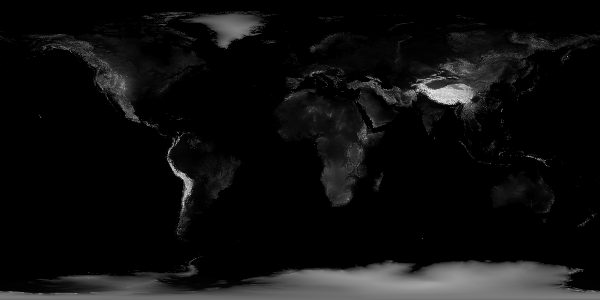

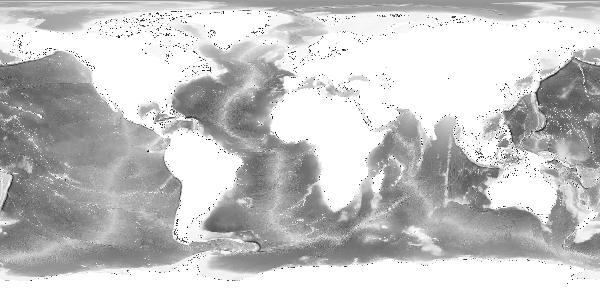

In [19]:
display(topo.resize((2 * 300, 300)), bath.resize((2 * 300, 300)))

In [20]:
atopo = np.array(topo)
abath = np.array(bath)[..., 0]

In [21]:
topo_range = [0, 6400]
bath_range = [-8000, 0]

In [22]:
topo_scaled = ((atopo - np.min(atopo)) / (np.max(atopo) - np.min(atopo))) * (np.max(topo_range) - np.min(topo_range)) + np.min(topo_range)
bath_scaled = ((abath - np.min(abath)) / (np.max(abath) - np.min(abath))) * (np.max(bath_range) - np.min(bath_range)) + np.min(bath_range)

bath_scaled[abath == 0] = 0

relief = topo_scaled + bath_scaled

collision = (abath != 0) & (atopo != 0)
relief[collision] = topo_scaled[collision]

<IPython.core.display.Javascript object>


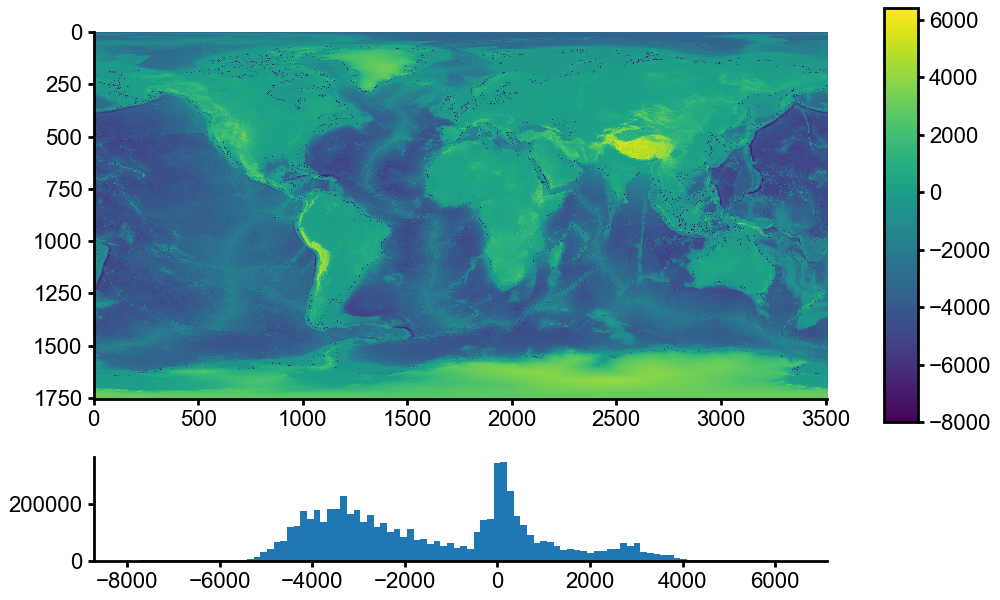

In [45]:
def plot_map(relief):
    f, axs = plt.subplots(nrows=2, figsize=(5, 3), constrained_layout=True, gridspec_kw=dict(height_ratios=[4, 1]))

    ax = axs[0]
    im = ax.imshow(relief)
    ax.set_aspect('equal')
    f.colorbar(im, ax=ax)

    ax = axs[1]
    ax.hist(relief.flatten(), bins=100)


plot_map(relief)

Standard "80 gram" A4 laserprinter paper is 0.11 mm. Let's assume I can just glue multiple pages to have different thicknesses

Because I'm thinking of cutting these by hand, I want to reduce the number of layers without loosing too much detail. We're more interested in the range just above 0 meters.

<IPython.core.display.Javascript object>


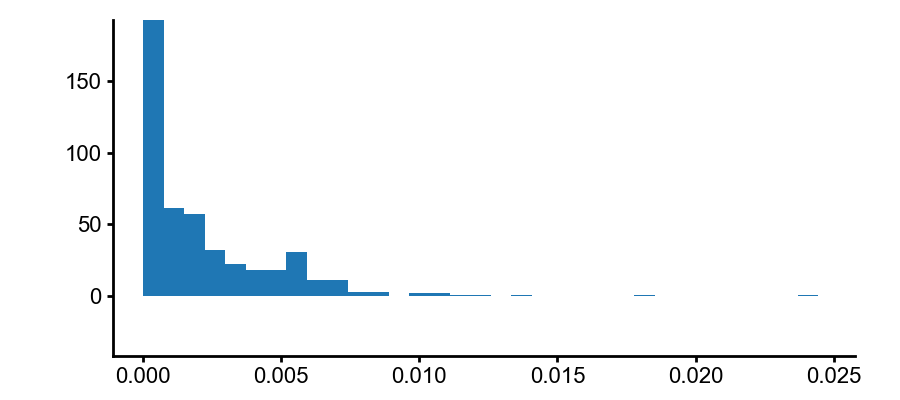

''

In [83]:
f, ax = plt.subplots()

ax.hist(np.diff(cumh_detailed))
;

<IPython.core.display.Javascript object>


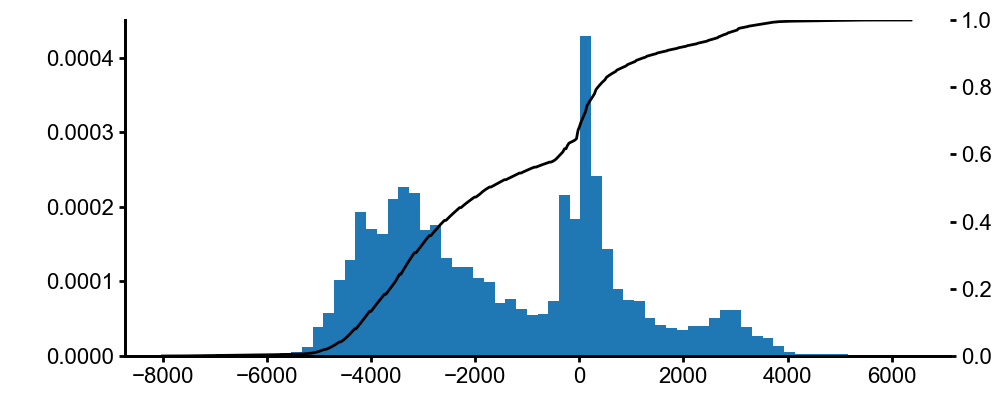

''

In [153]:
f, ax = plt.subplots(figsize=(5, 2))

ax.hist(relief.flatten(), bins=70, density=True)

tax = ax.twinx()
h_detailed, edges_detailed = np.histogram(relief.flatten(), bins=500, density=True);
cumh_detailed = np.cumsum(h_detailed) / np.max(np.cumsum(h_detailed))
tax.plot(edges_detailed[:-1], cumh_detailed, color='k', zorder=1000)

tax.set_ylim(0, 1)
;

In [108]:
import pandas as pd

<IPython.core.display.Javascript object>


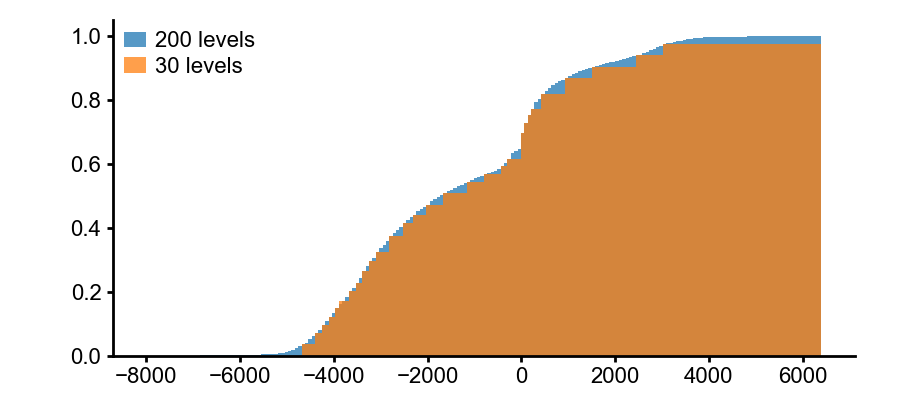

''

In [176]:
def merge_consecutive(h, threshold):
    def evaluate(cumsum_h):
        return np.concatenate([np.diff(cumsum_h.values) <= threshold, [False]])

    i = 0
    new_h = {}
    criteria = evaluate(h)
    
#     while np.any(criteria):
    for j in range(10):
        if not np.any(criteria):
            break

        while i < len(criteria):

            merge_start = None

            if not criteria[i]:
                new_h[h.index[i]] = h.iloc[i]
                i += 1

            else:

                while criteria[i] and i < len(criteria):
                    if merge_start is None:
                        merge_start = i
                    i += 1

                idx = pd.Interval(h.index[merge_start].left, h.index[i].right)
                
                # we're working cumsum so we take the highest density
                new_h[idx] = h.iloc[merge_start:i].max()
                
                i += 1
    
        new_h = pd.Series(new_h)
        
        # print(len(h), '->', len(new_h))

        h = new_h
        i = 0
        new_h = {}
        criteria = evaluate(h)
        
    return h
        

h_detailed, edges_detailed = np.histogram(relief.flatten(), bins=np.linspace(np.min(edges_detailed), np.max(edges_detailed), 200 + 1), density=True);
cumh_detailed = np.cumsum(h_detailed) / np.max(np.cumsum(h_detailed))

detailed = pd.Series(cumh_detailed, index=pd.IntervalIndex.from_breaks(edges_detailed))

merged = detailed

for i in range(1, 20 * 10):
    merged = merge_consecutive(merged, threshold=.0001 * i)

f, ax = plt.subplots()

for h in detailed, merged:
    ax.bar(
        h.index.left,
        h.values,
        width=h.index.length,
        alpha=.75,
        align='edge',
        label=f'{len(h)} levels',
    )
    
ax.legend()
;

In [185]:
merged_bins = np.concatenate([merged.index.left, [merged.index[-1].right]])

In [193]:
len(merged_bins)

31

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]


<IPython.core.display.Javascript object>


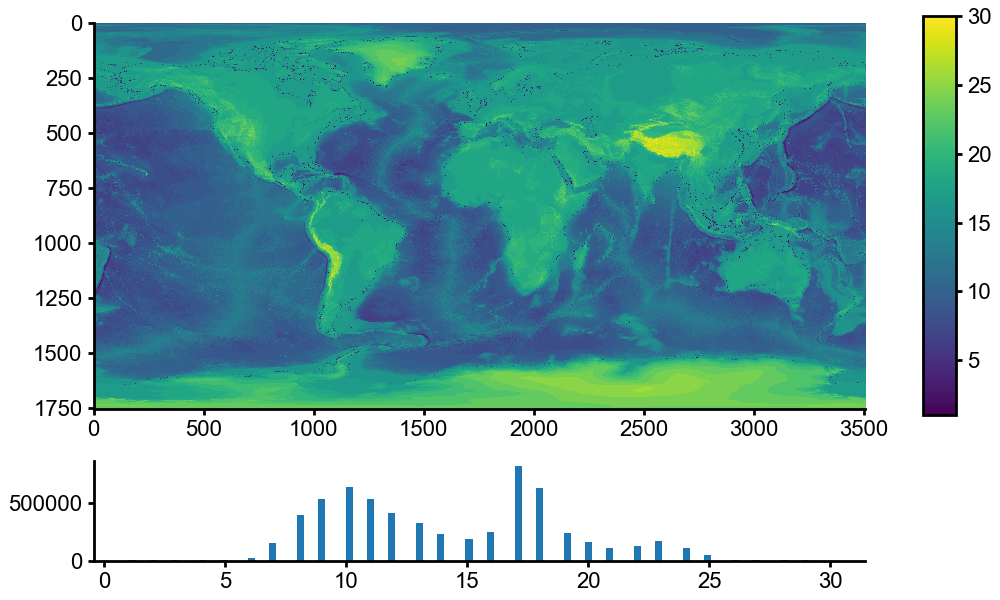

<IPython.core.display.Javascript object>


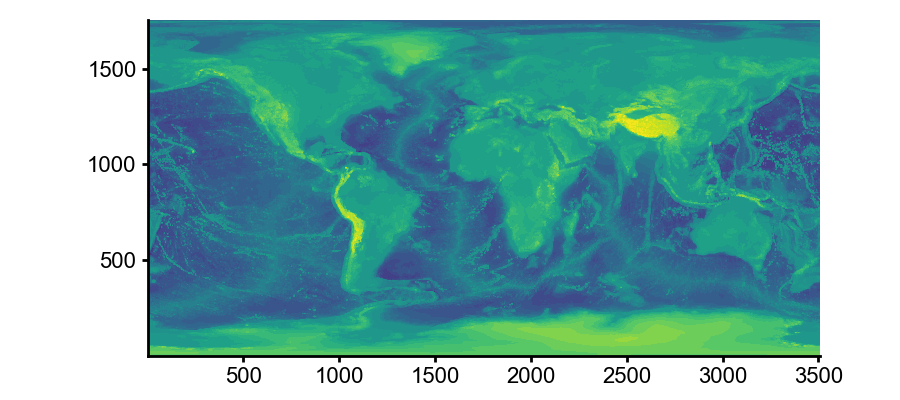

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]


<IPython.core.display.Javascript object>


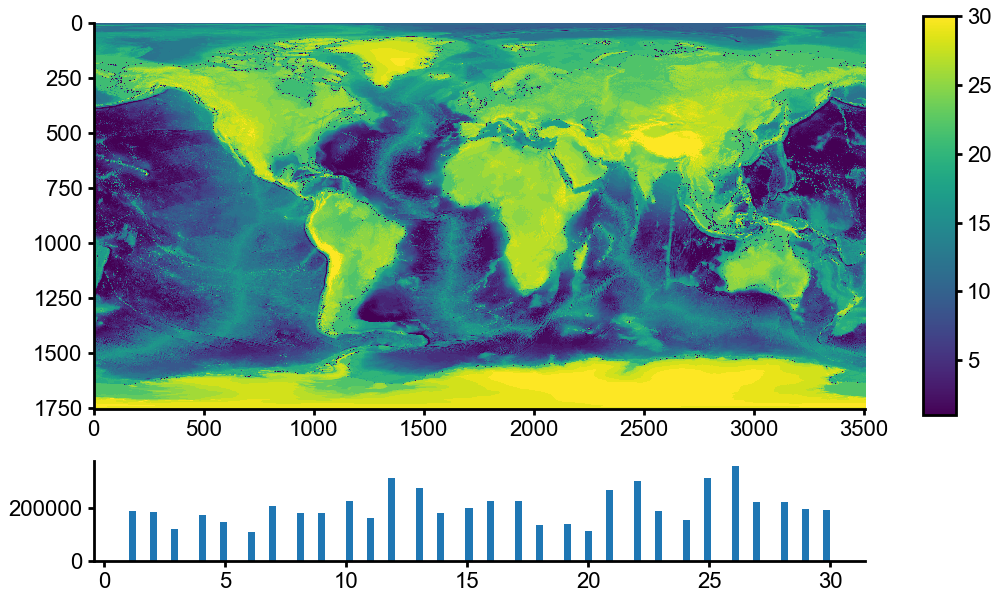

<IPython.core.display.Javascript object>


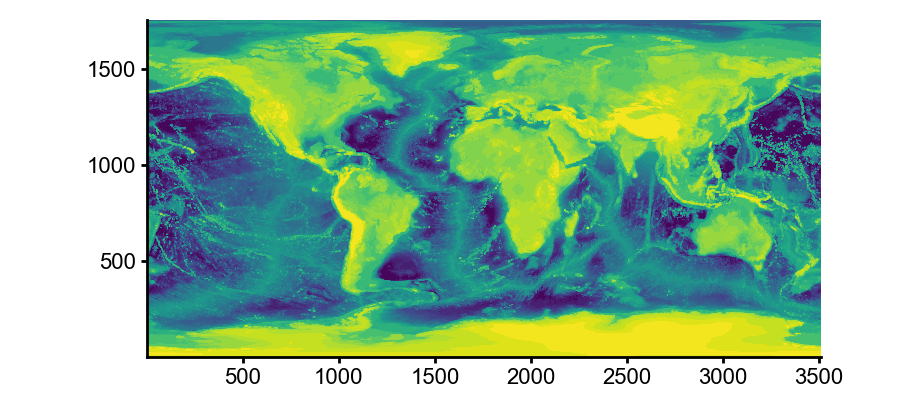

In [198]:
def show_quantized(relief, height_bins):
    relief_quantized = np.digitize(relief, bins=height_bins)
    
    relief_quantized[relief_quantized <= 1] = 1
    relief_quantized[relief_quantized >= len(height_bins) - 1] = len(height_bins) - 1
    
    print(np.unique(relief_quantized))
    plot_map(relief_quantized)
    
    f, ax = plt.subplots()
    ax.contourf(
        relief_quantized,
        origin='upper',
        levels=len(height_bins) - 1,
    )
    ax.set_aspect('equal')
    
    
show_quantized(relief, np.linspace(np.min(relief) - 1, np.max(relief) + 1, 30 + 1))
show_quantized(relief, merged_bins)

<IPython.core.display.Javascript object>


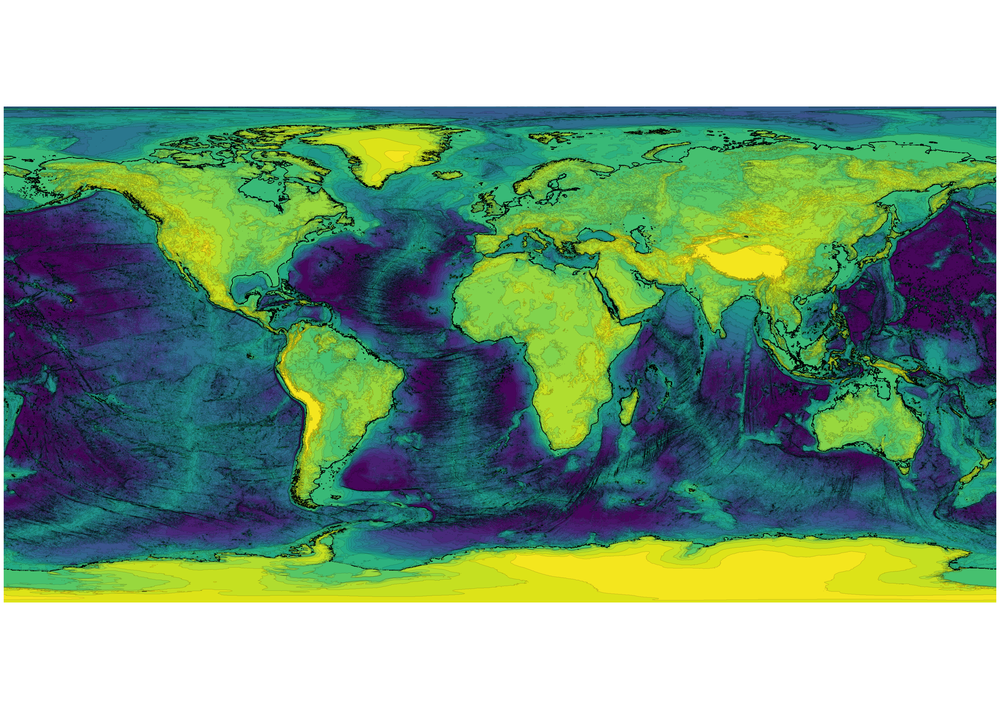

In [210]:
height_bins = merged_bins

relief_quantized = np.digitize(relief, bins=height_bins)

relief_quantized[relief_quantized <= 1] = 1
relief_quantized[relief_quantized >= len(height_bins) - 1] = len(height_bins) - 1
    
f, ax = plt.subplots(dpi=300, figsize=(11.7, 8.3), constrained_layout=True)
ax.contourf(
    relief_quantized,
    origin='upper',
    levels=len(height_bins) - 1,
    cmap='viridis',
)
ax.contour(
    relief_quantized,
    origin='upper',
    levels=len(height_bins) - 1,
    colors='k',
    alpha=.25,
    linewidths=.25,
)
ax.axis('off')
ax.set_aspect('equal')

f.savefig('heights.pdf', dpi=300)
f.savefig('heights.jpg', dpi=300)